# Gradient Boosting Desicion Tree

En las clases anteriores, observamos cómo las mejoras en los algoritmos y las optimizaciones pueden generar avances significativos en la ganancia. Ya hemos logrado un progreso considerable con los modelos de Random Forest. Hoy, daremos un paso aún más grande al explorar los modelos que actualmente están obteniendo los mejores resultados en este tipo de dominios.

Antes que nada, carguemos el entorno de trabajo


In [ ]:
#%pip install scikit-learn==1.3.2
%pip install seaborn==0.13.1
%pip install numpy==1.26.4
%pip install matplotlib==3.7.1
%pip install pandas==2.1.4
%pip install lightgbm==4.4.0
%pip install optuna==3.6.1

^C
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: C:\Users\Usuario\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: C:\Users\Usuario\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


^C
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: C:\Users\Usuario\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: C:\Users\Usuario\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.model_selection import ShuffleSplit, StratifiedShuffleSplit
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer

import lightgbm as lgb

import optuna
from optuna.visualization import plot_optimization_history, plot_param_importances, plot_slice, plot_contour

from time import time

import pickle

In [2]:
base_path = 'C:/Users/Usuario/Downloads/'
dataset_path = base_path + 'datos/'
modelos_path = base_path + 'modelos/'
db_path = base_path + 'db/'
dataset_file = 'competencia_01.csv'

ganancia_acierto = 273000
costo_estimulo = 7000

mes_train = 202104
mes_test = 202106

# agregue sus semillas
semillas = [945787,945799,945809,945811,945817]

data = pd.read_csv(dataset_path + dataset_file)

In [3]:
data

,numero_de_cliente,foto_mes,active_quarter,cliente_vip,internet,cliente_edad,cliente_antiguedad,mrentabilidad,mrentabilidad_annual,mcomisiones,...,Visa_fultimo_cierre,Visa_mpagado,Visa_mpagospesos,Visa_mpagosdolares,Visa_fechaalta,Visa_mconsumototal,Visa_cconsumos,Visa_cadelantosefectivo,Visa_mpagominimo,clase_ternaria
0,249667857,202101,1,0,0,79,68,2479.93,56664.62,3774.29,...,25.0,44238.07,-50488.61,0.0,1908.0,31985.48,12.0,0.0,2909.04,CONTINUA
1,249667857,202102,1,0,0,79,69,3213.23,54528.47,3498.16,...,18.0,77686.82,-44238.07,0.0,1936.0,61647.57,19.0,0.0,4692.00,CONTINUA
2,249667857,202103,1,0,0,79,70,6404.48,55195.70,4612.71,...,21.0,70519.14,-77686.82,0.0,1967.0,51918.80,14.0,0.0,4551.24,CONTINUA
3,249667857,202104,1,0,0,79,71,5430.67,55893.62,4673.99,...,23.0,47442.89,-70519.14,0.0,1997.0,26420.46,10.0,0.0,3143.64,CONTINUA
4,249667857,202105,1,0,0,79,72,3723.86,53480.16,4395.07,...,26.0,68765.04,-47442.89,0.0,2028.0,52738.36,11.0,0.0,4398.75,BAJA+1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
981941,1587272073,202105,1,0,0,40,3,-5966.15,-5816.35,45.75,...,5.0,0.00,-2889.83,0.0,90.0,4474.73,1.0,0.0,0.00,BAJA+1
981942,1587272073,202106,1,0,0,40,4,209.39,-5606.96,170.31,...,0.0,0.00,-960.20,0.0,120.0,3519.00,2.0,0.0,0.00,BAJA+1
981943,1587595721,202105,1,0,0,19,3,-4840.10,-4232.58,0.00,...,5.0,0.00,0.00,0.0,22.0,0.00,0.0,0.0,0.00,BAJA+1
981944,1587595721,202106,1,0,0,19,4,476.82,-3755.75,0.00,...,0.0,0.00,0.00,0.0,52.0,2245.40,1.0,0.0,0.00,BAJA+1


In [5]:
# Ordenar los datos por cliente y por foto_mes para asegurarse de que el cálculo de deltas sea secuencial
data = data.sort_values(by=['numero_de_cliente', 'foto_mes'])

# Seleccionar las columnas numéricas donde tiene sentido calcular deltas
columnas_a_calcular = data.select_dtypes(include=['float64', 'int64']).columns

# Excluir las columnas 'cliente' y 'foto_mes' ya que no queremos calcular deltas para estas
columnas_a_calcular = [col for col in columnas_a_calcular if col not in ['numero_de_cliente', 'foto_mes']]

# Calcular los deltas para todas las columnas numéricas
for columna in columnas_a_calcular:
    data[f'delta_{columna}'] = data.groupby('numero_de_cliente')[columna].diff()

# Visualizar las primeras filas del dataframe con los deltas
print(data.head())

C:\Users\Usuario\AppData\Local\Temp\ipykernel_16976\3472677442.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data[f'delta_{columna}'] = data.groupby('numero_de_cliente')[columna].diff()
C:\Users\Usuario\AppData\Local\Temp\ipykernel_16976\3472677442.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data[f'delta_{columna}'] = data.groupby('numero_de_cliente')[columna].diff()
C:\Users\Usuario\AppData\Local\Temp\ipykernel_16976\3472677442.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the resul

        numero_de_cliente  foto_mes  active_quarter  cliente_vip  internet  \
806945          249221109    202101               1            0         0   
806946          249221109    202102               1            0         0   
806947          249221109    202103               1            0         0   
806948          249221109    202104               1            0         0   
806949          249221109    202105               1            0         0   

        cliente_edad  cliente_antiguedad  mrentabilidad  mrentabilidad_annual  \
806945            61                 300        1664.94              17994.40   
806946            61                 301        1002.92              18337.34   
806947            61                 302         769.74              18596.58   
806948            62                 303        1532.79              19935.00   
806949            62                 304        1804.14              20862.15   

        mcomisiones  ...  delta_Visa_mpagosd

Vamos a asignar pesos a las clases. En unos minutos explicaremos las razones detrás de esta decisión. Mientras tanto, pueden aprovechar el código para ajustar el peso de la clase **BAJA+2** según lo deseen.


In [6]:
data['clase_peso'] = 1.0

data.loc[data['clase_ternaria'] == 'BAJA+2', 'clase_peso'] = 1.00002
data.loc[data['clase_ternaria'] == 'BAJA+1', 'clase_peso'] = 1.00001

C:\Users\Usuario\AppData\Local\Temp\ipykernel_16976\4274781880.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data['clase_peso'] = 1.0


In [7]:
data

data.drop(['cprestamos_personales', 'mprestamos_personales'], axis=1, inplace=True)


Además, como se mencionó en la clase pasada, comenzaremos a experimentar con nuevas clases para ajustar el modelo. En particular, sumaremos la clase **BAJA+1**, que es estructuralmente muy similar a **BAJA+2**, para aumentar los casos positivos. Luego, compararemos los resultados obtenidos con los de la clase con la que hemos estado trabajando hasta ahora.

In [8]:
data['clase_binaria1'] = 0
data['clase_binaria2'] = 0
data['clase_binaria1'] = np.where(data['clase_ternaria'] == 'BAJA+2', 1, 0)
data['clase_binaria2'] = np.where(data['clase_ternaria'] == 'CONTINUA', 0, 1)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_16976\3343849687.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data['clase_binaria1'] = 0
C:\Users\Usuario\AppData\Local\Temp\ipykernel_16976\3343849687.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data['clase_binaria2'] = 0


In [9]:
data

,numero_de_cliente,foto_mes,active_quarter,cliente_vip,internet,cliente_edad,cliente_antiguedad,mrentabilidad,mrentabilidad_annual,mcomisiones,...,delta_Visa_cconsumos,delta_Visa_cadelantosefectivo,delta_Visa_mpagominimo,delta_delta_active_quarter,delta_delta_cliente_vip,delta_delta_internet,delta_delta_cliente_edad,clase_peso,clase_binaria1,clase_binaria2
806945,249221109,202101,1,0,0,61,300,1664.94,17994.40,1605.81,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00000,0,0
806946,249221109,202102,1,0,0,61,301,1002.92,18337.34,1312.91,...,3.0,0.0,-73992.84,NaN,NaN,NaN,NaN,1.00000,0,0
806947,249221109,202103,1,0,0,61,302,769.74,18596.58,1662.56,...,-4.0,0.0,-1008.78,0.0,0.0,0.0,0.0,1.00000,0,0
806948,249221109,202104,1,0,0,62,303,1532.79,19935.00,1899.52,...,1.0,0.0,-469.20,0.0,0.0,0.0,1.0,1.00000,0,0
806949,249221109,202105,1,0,0,62,304,1804.14,20862.15,2693.91,...,-1.0,0.0,-868.02,0.0,0.0,0.0,-1.0,1.00001,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479552,1598444941,202106,0,0,0,27,1,0.00,0.00,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00001,0,1
283459,1598471047,202106,1,0,0,28,1,95.20,95.20,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00001,0,1
42802,1598515897,202106,0,0,0,30,1,72.08,72.08,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00001,0,1
829670,1598517059,202106,0,0,0,24,1,0.00,0.00,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00001,0,1


Y trabajaremos como es habitual en las últimas clases, con **Febrero** para entrenar y **Abril** para medir, con el fin de realizar *backtesting*

In [10]:
train_data = data[data['foto_mes'] == mes_train]
test_data = data[data['foto_mes'] == mes_test]

X_train = train_data.drop(['clase_ternaria', 'clase_peso', 'clase_binaria1','clase_binaria2'], axis=1)
y_train_binaria1 = train_data['clase_binaria1']
y_train_binaria2 = train_data['clase_binaria2']
w_train = train_data['clase_peso']

X_test = test_data.drop(['clase_ternaria', 'clase_peso', 'clase_binaria1','clase_binaria2'], axis=1)
y_test_binaria1 = test_data['clase_binaria1']
y_test_class = test_data['clase_ternaria']
w_test = test_data['clase_peso']

In [11]:
test_data.head()

,numero_de_cliente,foto_mes,active_quarter,cliente_vip,internet,cliente_edad,cliente_antiguedad,mrentabilidad,mrentabilidad_annual,mcomisiones,...,delta_Visa_cconsumos,delta_Visa_cadelantosefectivo,delta_Visa_mpagominimo,delta_delta_active_quarter,delta_delta_cliente_vip,delta_delta_internet,delta_delta_cliente_edad,clase_peso,clase_binaria1,clase_binaria2
806950,249221109,202106,1,0,0,62,305,399.88,20332.88,2115.35,...,0.0,0.0,1114.35,0.0,0.0,0.0,0.0,1.00001,0,1
410532,249221468,202106,1,0,0,53,42,4708.37,23227.25,5537.14,...,18.0,0.0,0.00,0.0,0.0,0.0,0.0,1.00001,0,1
27474,249223005,202106,1,0,0,49,207,3534.50,38207.62,534.72,...,0.0,0.0,46.92,0.0,0.0,0.0,0.0,1.00001,0,1
375803,249228180,202106,1,0,0,66,325,-138.82,1445.30,417.78,...,0.0,0.0,480.93,0.0,0.0,0.0,0.0,1.00001,0,1
822333,249232117,202106,1,0,0,80,378,556.99,36468.62,484.57,...,0.0,0.0,539.58,0.0,0.0,0.0,0.0,1.00001,0,1


In [12]:
train_data

,numero_de_cliente,foto_mes,active_quarter,cliente_vip,internet,cliente_edad,cliente_antiguedad,mrentabilidad,mrentabilidad_annual,mcomisiones,...,delta_Visa_cconsumos,delta_Visa_cadelantosefectivo,delta_Visa_mpagominimo,delta_delta_active_quarter,delta_delta_cliente_vip,delta_delta_internet,delta_delta_cliente_edad,clase_peso,clase_binaria1,clase_binaria2
806948,249221109,202104,1,0,0,62,303,1532.79,19935.00,1899.52,...,1.0,0.0,-469.20,0.0,0.0,0.0,1.0,1.0,0,0
410530,249221468,202104,1,0,0,53,40,3413.58,16311.12,4268.13,...,1.0,0.0,0.00,0.0,0.0,0.0,0.0,1.0,0,0
27472,249223005,202104,1,0,0,49,205,2282.09,35034.77,497.23,...,5.0,0.0,6228.63,0.0,0.0,0.0,0.0,1.0,0,0
375801,249228180,202104,1,0,0,66,323,214.11,2406.24,309.60,...,1.0,0.0,46.92,0.0,0.0,0.0,0.0,1.0,0,0
822331,249232117,202104,1,0,0,80,376,309.50,37935.46,467.17,...,-3.0,0.0,-199.41,0.0,0.0,0.0,1.0,1.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157461,1592771867,202104,1,0,0,28,1,35.79,35.79,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,0
784715,1592792217,202104,1,0,0,18,1,4.85,4.85,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,0
933148,1592797828,202104,0,0,0,36,1,47.62,47.62,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,0
772823,1592799066,202104,0,0,0,37,1,0.00,0.00,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0,0


Y preparamos el *dataset* para poder usar el **rf** de una clase anterior.

In [13]:
imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
Xif = imp_mean.fit_transform(X_test)

Comenzaremos explicando el funcionamiento del protagonista de esta clase: **LightGBM**. Primero, partiremos con una revisión de cómo funciona el algoritmo en el que se basa, **XGBoost**. Para una introducción completa, puedes consultar este

https://xgboost.readthedocs.io/en/stable/tutorials/model.html.

Aunque en la cátedra no somos grandes seguidores de Josh Starmer y su canal *StatQuest*, reconozco que sus series sobre *Gradient Boosting* y *XGBoost* son excelentes recursos. Aquí te dejamos los enlaces a esas dos series que realmente valen la pena:

[Serie Gradient Boosting](https://www.youtube.com/watch?v=3CC4N4z3GJc&list=PLblh5JKOoLUJjeXUvUE0maghNuY2_5fY6)

[Serie XGBoost](https://www.youtube.com/watch?v=OtD8wVaFm6E&list=PLblh5JKOoLULU0irPgs1SnKO6wqVjKUsQ)

Finalmente, analizaremos las diferencias clave que ofrece **LightGBM** frente a XGBoost. Puedes explorar más sobre ello en este https://lightgbm.readthedocs.io/en/stable/Features.html.

No olvides tener a mano la [documentación de LightGBM](https://lightgbm.readthedocs.io/)y la [lista completa de sus parámetros](https://lightgbm.readthedocs.io/en/latest/Parameters.html).

Este es un algoritmo muy usado en el mercado, recomiendo dedicarle el tiempo necesario para aprenderlo bien.

Vamos a utilizar el algoritmo directamente, sin pasar por *scikit-learn*. Sin embargo, si algún alumno lo prefiere, puede optar por usar el *wrapper* de sklearn para este caso.

Para evaluar la calidad del modelo, crearemos nuestra propia función de evaluación que calcule la ganancia. La razón de incluir los pesos es precisamente para poder implementar esta función de evaluación de manera adecuada. Al combinar las clases *BAJA+1* y *BAJA+2* en una sola, necesitamos una forma de diferenciarlas, y es aquí donde entra en juego el *weight*. Este parámetro nos permitirá distinguir entre ambas clases al momento de evaluarlas dentro del algoritmo.


In [14]:
def lgb_gan_eval(y_pred, data):
    weight = data.get_weight()
    ganancia = np.where(weight == 1.00002, ganancia_acierto, 0) - np.where(weight < 1.00002, costo_estimulo, 0)
    ganancia = ganancia[np.argsort(y_pred)[::-1]]
    ganancia = np.cumsum(ganancia)

    return 'gan_eval', np.max(ganancia) , True

# Parámetros del modelos.
params = {
    'objective': 'binary',
    'metric': 'gan_eval',
    'boosting_type': 'gbdt',
    'max_bin': 31,
    'num_leaves': 31,
    'learning_rate': 0.01,
    'feature_fraction': 0.3,
    'bagging_fraction': 0.7,
    'verbose': 0
}

LGBM necesita su propio tipo de Datasets:

In [15]:
train_data1 = lgb.Dataset(X_train, label=y_train_binaria1, weight=w_train)
train_data2 = lgb.Dataset(X_train, label=y_train_binaria2, weight=w_train)

A continuación, compararemos las dos clases. Utilizaremos para medir la calidad de las clases (y de los parámetros), la función **cv** que viene *out-of-the-box*

In [16]:
cv_results1 = lgb.cv(
    params,
    train_data1,
    num_boost_round=150,
    feval=lgb_gan_eval,
    nfold=5,
    seed=semillas[0]
)

cv_results2 = lgb.cv(
    params,
    train_data2,
    num_boost_round=150,
    feval=lgb_gan_eval,
    nfold=5,
    seed=semillas[0]
)

KeyboardInterrupt: 

Y vizualizamos los resultados de ambas ejecuciones:

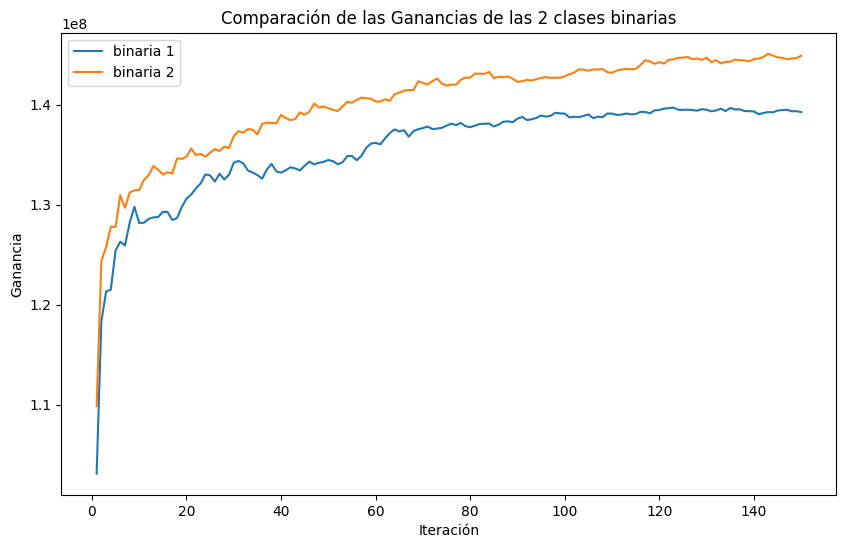

In [18]:
df_ganancias = pd.DataFrame({
    'binaria1': cv_results1['valid gan_eval-mean'],
    'binaria2': cv_results2['valid gan_eval-mean'],
    'Iteracion': range(1, len(cv_results1['valid gan_eval-mean']) + 1)
})

# Normalizamos la ganancias
df_ganancias['binaria1'] = df_ganancias['binaria1']*5
df_ganancias['binaria2'] = df_ganancias['binaria2']*5

plt.figure(figsize=(10, 6))
sns.lineplot(x='Iteracion', y='binaria1', data=df_ganancias, label='binaria 1')
sns.lineplot(x='Iteracion', y='binaria2', data=df_ganancias, label='binaria 2')
plt.title('Comparación de las Ganancias de las 2 clases binarias')
plt.xlabel('Iteración')
plt.ylabel('Ganancia')
plt.legend()
plt.show()


Se observa una ligera mejora al combinar las clases en modelos sencillos. Dado que cada pequeña mejora es importante, continuaremos utilizando esta estrategia.

A continuación, procederemos a optimizar **LightGBM** utilizando la librería **Optuna**. Cabe destacar que las optimizaciones que realizaremos son básicas y están diseñadas para ejecutarse en pocos minutos. Será su responsabilidad ampliar tanto el rango de búsqueda como el tiempo de optimización para obtener un modelo más competitivo.


In [ ]:

def objective(trial):

    num_leaves = trial.suggest_int('num_leaves', 8, 100),
    learning_rate = trial.suggest_float('learning_rate', 0.005, 0.3), # mas bajo, más iteraciones necesita
    min_data_in_leaf = trial.suggest_int('min_data_in_leaf', 1, 1000),
    feature_fraction = trial.suggest_float('feature_fraction', 0.1, 1.0),
    bagging_fraction = trial.suggest_float('bagging_fraction', 0.1, 1.0),

    params = {
        'objective': 'binary',
        'metric': 'custom',
        'boosting_type': 'gbdt',
        'first_metric_only': True,
        'boost_from_average': True,
        'feature_pre_filter': False,
        'max_bin': 31,
        'num_leaves': num_leaves,
        'learning_rate': learning_rate,
        'min_data_in_leaf': min_data_in_leaf,
        'feature_fraction': feature_fraction,
        'bagging_fraction': bagging_fraction,
        'seed': semillas[0],
        'verbose': -1
    }
    train_data = lgb.Dataset(X_train,
                              label=y_train_binaria2, # eligir la clase
                              weight=w_train)
    cv_results = lgb.cv(
        params,
        train_data,
        num_boost_round=100, # modificar, subit y subir... y descomentar la línea inferior
        # early_stopping_rounds= int(50 + 5 / learning_rate),
        feval=lgb_gan_eval,
        stratified=True,
        nfold=5,
        seed=semillas[0]
    )
    max_gan = max(cv_results['valid gan_eval-mean'])
    best_iter = cv_results['valid gan_eval-mean'].index(max_gan) + 1

    # Guardamos cual es la mejor iteración del modelo
    trial.set_user_attr("best_iter", best_iter)

    return max_gan * 5


storage_name = "sqlite:///" + db_path + "optimization_lgbm1.db"
study_name = "exp_301_lgbm1"

study = optuna.create_study(
    direction="maximize",
    study_name=study_name,
    storage=storage_name,
    load_if_exists=True,
)

[I 2024-10-13 23:03:03,156] Using an existing study with name 'exp_301_lgbm' instead of creating a new one.


In [20]:
study.optimize(objective, n_trials=50) # subir subir

[I 2024-10-13 23:04:29,334] Trial 221 finished with value: 151256000.0 and parameters: {'num_leaves': 29, 'learning_rate': 0.10994888104380145, 'min_data_in_leaf': 317, 'feature_fraction': 0.18493306265379617, 'bagging_fraction': 0.18202477888286694}. Best is trial 221 with value: 151256000.0.
[W 2024-10-13 23:04:47,345] Trial 222 failed with parameters: {'num_leaves': 29, 'learning_rate': 0.13217682197579247, 'min_data_in_leaf': 363, 'feature_fraction': 0.23113795981021004, 'bagging_fraction': 0.18946110256421794} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "C:\Users\Usuario\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\optuna\study\_optimize.py", line 196, in _run_trial
    value_or_values = func(trial)
  File "C:\Users\Usuario\AppData\Local\Temp\ipykernel_16920\1487287613.py", line 28, in objective
    cv_results = lgb.cv(
  File "C:\Users\Usuario\AppData\

KeyboardInterrupt: 

Analizamos los resultados as usual

In [38]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: C:\Users\Usuario\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [39]:
import plotly

In [40]:
pip install nbformat


[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: C:\Users\Usuario\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [41]:
pip install --upgrade nbformat

^C
Note: you may need to restart the kernel to use updated packages.


In [21]:
import optuna.visualization as vis
vis.plot_optimization_history(study)
#optuna.visualization.plot_optimization_history(study)




In [22]:
plot_param_importances(study)

El **learning rate** es un parámetro que tiene que ir acompañado por más árboles.

In [23]:
plot_slice(study)

In [24]:
plot_contour(study)

In [46]:
plot_contour(study, params=['num_leaves','min_data_in_leaf'] )

Y finalmente tomamos el mejor modelo y lo entrenamos con la totalidad de los datos

In [25]:
best_iter = study.best_trial.user_attrs["best_iter"]
print(f"Mejor cantidad de árboles para el mejor model {best_iter}")
params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'first_metric_only': True,
    'boost_from_average': True,
    'feature_pre_filter': False,
    'max_bin': 31,
    'num_leaves': study.best_trial.params['num_leaves'],
    'learning_rate': study.best_trial.params['learning_rate'],
    'min_data_in_leaf': study.best_trial.params['min_data_in_leaf'],
    'feature_fraction': study.best_trial.params['feature_fraction'],
    'bagging_fraction': study.best_trial.params['bagging_fraction'],
    'seed': semillas[0],
    'verbose': 0
}

train_data = lgb.Dataset(X_train,
                          label=y_train_binaria2,
                          weight=w_train)

model = lgb.train(params,
                  train_data,
                  num_boost_round=best_iter)


Mejor cantidad de árboles para el mejor model 75


Observamos la variables más importantes para el modelo:

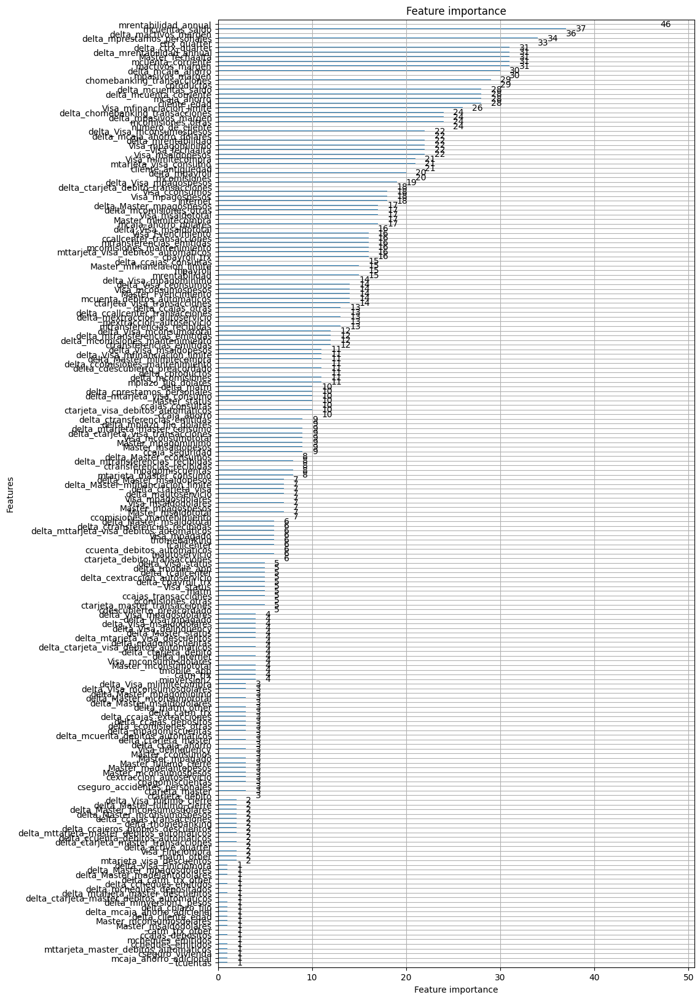

In [26]:
lgb.plot_importance(model, figsize=(10, 20))
plt.show()


Y si queremos tener las variables más importantes en forma de *Dataframe*:

In [49]:
importances = model.feature_importance()
feature_names = X_train.columns.tolist()
importance_df = pd.DataFrame({'feature': feature_names, 'importance': importances})
importance_df = importance_df.sort_values('importance', ascending=False)
importance_df[importance_df['importance'] > 0]


,feature,importance
22,mcuentas_saldo,120
8,mrentabilidad_annual,109
10,mactivos_margen,104
5,cliente_edad,97
132,Visa_mfinanciacion_limite,85
...,...,...
117,Master_mconsumosdolares,1
84,ccheques_depositados,1
120,Master_madelantodolares,1
122,Master_mpagado,1


Para guardar el modelo para poder utilizarlo más adelante, no es necesario guardarlo como *pickle*, la librería nos permite guardarlo en formato texto

In [54]:
model.save_model(modelos_path + 'lgb_second.txt')

Y recuperar el mismo desde ese formato

In [35]:
model = lgb.Booster(model_file=modelos_path + 'lgb_second.txt')

Para realizar nuestra habitual comparación de modelos, partiremos desde el mejor que obtuvimos hasta ahora, el **rf**. Para este fin cargaremos el *binario* que ajustamos un par de clases atrás:

In [30]:
#filename_rf_1000 = modelos_path + 'exp_206_random_forest_model_1000.sav'
#model_rf_1000 = pickle.load(open(filename_rf_1000, 'rb'))

FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/Usuario/Downloads/modelos/exp_206_random_forest_model_1000.sav'

Y sobre ambos modelos obtenemos la predicción de **Abril**

In [56]:
#y_pred_rf = model_rf_1000.predict_proba(Xif)
#y_pred_rf = y_pred_rf[:,1] # adaptamos la salida para que sea homogénea con el LGBM

y_pred_lgm = model.predict(X_test)

LightGBMError: The number of features in data (304) is not the same as it was in training data (152).
You can set ``predict_disable_shape_check=true`` to discard this error, but please be aware what you are doing.

In [52]:

y_pred_prob = model.predict(X_test)

# Convertir a predicciones binarias usando un umbral de 0.030
threshold = 0.030
y_pred_binary = (y_pred_prob >= threshold).astype(int)

# Agregar las columnas de probabilidades y predicciones al DataFrame original
X_test['probabilidad'] = y_pred_prob
X_test['prediccion'] = y_pred_binary


LightGBMError: The number of features in data (304) is not the same as it was in training data (152).
You can set ``predict_disable_shape_check=true`` to discard this error, but please be aware what you are doing.

In [60]:
#valores_unicos_prediccion = predictions_df['prediccion'].unique()
#print("Valores únicos de prediccion:", valores_unicos_prediccion)

NameError: name 'predictions_df' is not defined

In [32]:
X_test.prediccion.value_counts()

AttributeError: 'DataFrame' object has no attribute 'prediccion'

In [46]:
# Filtrar el DataFrame para quedarte solo con 'numero_de_cliente' y 'prediccion'
result_df = X_test[['numero_de_cliente', 'prediccion']]

# Renombrar la columna 'prediccion' a 'Predicted' si es necesario
result_df.rename(columns={'prediccion': 'Predicted'}, inplace=True)

# Ver las primeras filas del DataFrame resultante
print(result_df.head())

KeyError: "['prediccion'] not in index"

In [45]:
# Especificar la ruta completa del archivo donde deseas guardar el DataFrame
output_file = dataset_path + "predicciones_v2.csv"

# Guardar el DataFrame como un archivo CSV en la ruta 
result_df.to_csv(output_file, index=False)

NameError: name 'result_df' is not defined

In [65]:
y_pred_rf = model_rf_1000.predict_proba(Xif)
y_pred_rf = y_pred_rf[:,1] # adaptamos la salida para que sea homogénea con el LGBM

y_pred_lgm = model.predict(X_test)

LightGBMError: The number of features in data (154) is not the same as it was in training data (152).
You can set ``predict_disable_shape_check=true`` to discard this error, but please be aware what you are doing.